Question 1

Suppose your input is a 300 by 300 color (RGB) image, and you use a convolutional layer with 100 filters that are each 5x5. How many parameters does this hidden layer have (including the bias parameters)? 

The filter size is 5x5x3 because it has a depth of 3 to match the number of channels in the input image. Therefore, the number of parameters per filter is 5 × 5 × 3 = 75. Since there are 100 filters in the convolutional layer, the total number of parameters without biases would be 100 × 75 = 7,500. Each filter also has a bias parameter associated with it. So, we add 100 bias parameters. 7,500 + 100 = 7,600

Question 2

You have an input volume that is 63x63x16, and convolve it with 32 filters that are each 7x7, using a stride of 2 and no padding. What is the output volume?

Output volume size = (input volume size - filter size / stride) + 1. 
For both width & height it'll be ((63-7) - 2) + 1 = (56/2) + 1 = 28 + 1  = 29. So the output volume size will be 29 x 29 x 32.

Question 3

Build a small CNN model consisting of 5 convolution layers. Each convolution layer would be followed by a ReLU activation and a max pooling layer. Here is sample code (in keras) for building one such conv-relu-maxpool block in keras.

After 5 such conv-relu-maxpool blocks of layers you should have one dense layer followed by the output layer containing 10 neurons (1 for each of the 10 classes).

The input layer should be compatible with the images in the iNaturalist datasetLinks to an external site..

The code should be flexible such that the number of filters, size of filters and activation function in each layer can be changed. You should also be able to change the number of neurons in the dense layer.

In [1]:
import os

In [2]:
os.getcwd()

'/Users/hannahkaufman/BMI505/Assignment_2_Final'

In [3]:
import keras
from keras.models import Sequential
from keras.layers import Conv2D, Activation, MaxPooling2D, Flatten, Dense
from keras import optimizers
from keras.optimizers import SGD, Adam, RMSprop

input_shape = (224, 224, 3)
conv_layers = 5
filters = 64
filter_size = (2,2)
pool_size = (2,2)
activation = 'relu'
neurons = 10
classes = 10
optimizer = 'Adam'

def cnn_model(input_shape, conv_layers, filters, filter_size, pool_size, activation, neurons, classes):
    model = Sequential()
    model.add(Conv2D(filters, filter_size, padding='same', input_shape=input_shape))
    model.add(Activation(activation))
    model.add(MaxPooling2D(pool_size))

    for i in range(1, conv_layers):
        model.add(Conv2D(filters, filter_size, padding='same'))  # Padding='same' maintains the same spatial dimensions
        model.add(Activation(activation))
        model.add(MaxPooling2D(pool_size))

    model.add(Flatten())
    model.add(Dense(neurons, activation=activation))
    model.add(Dense(classes, activation='softmax'))

    return model 

# Create the model
model = cnn_model(input_shape, conv_layers, filters, filter_size, pool_size, activation, neurons, classes)

# Display model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      832       
                                                                 
 activation (Activation)     (None, 224, 224, 64)      0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 64)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      16448     
                                                                 
 activation_1 (Activation)   (None, 112, 112, 64)      0         
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                   

(a) What is the total number of computations done by your network? (assume m filters in each layer of size k× k and n neurons in the dense layer) The total number of computations done by my network is 

In [4]:
# Number of operations for convolutional layers
# Each convolution operation involves a dot product of filter and input volume
# For each layer, consider number of operations per output feature map multiplied by number of output feature maps
conv_operation_per_map = (2 * filter_size[0] * filter_size[1] * input_shape[2] - 1)
conv_total_operation = conv_operation_per_map * (input_shape[0] // (2 ** conv_layers)) * (input_shape[1] // (2 ** conv_layers)) * filters * (conv_layers + 1)

# Number of operations for fully connected layers
# First dense layer
dense1_total_operation = (input_shape[0] // (2 ** conv_layers)) * (input_shape[1] // (2 ** conv_layers)) * filters * neurons
# Second dense layer
dense2_total_operation = neurons * classes

# Total number of operations
total_operations = conv_total_operation + dense1_total_operation + dense2_total_operation

print("Total number of computations:", total_operations)

Total number of computations: 464228


(b) What is the total number of parameters in your network? (assume m filters in each layer of size k×k and n neurons in the dense layer)

The total number of parameters is 98,104. It given at the end of model_summary(). 

Question 4

You will now train your model using the iNaturalist dataset. The zip file contains a train and a test folder. 
Set aside 10% of the training data for hyperparameter tuning. Make sure each class is equally represented in the validation data. 
Do not use the test data for hyperparameter tuning.

Find the best hyperparameter configuration. Here are some suggestions but you are free to decide which hyperparameters you want to explore
- number of filters in each layer : 32, 64, ...
- filter organisation: same number of filters in all layer, doubling in each subsequent layer, halving in each subsequent layer, etc
- data augmentation (easy to do in keras): Yes, No
- dropout: 20%, 30% (btw, where will you add dropout? you should read up a bit on this)
- batch normalisation: Yes, No

Based on your sweep please paste the following plots:

- accuracy v/s created plot (I would like to see the number of experiments you ran to get the best configuration).
- each hyperparameter with the loss/accuracy

Also write down the hyperparameters and their values that you sweeped over. 
Smart strategies to reduce the number of runs while still achieving a high accuracy would be appreciated. 
Write down any unique strategy that you tried.

In [5]:
import keras
from keras.models import Sequential
from keras.layers import Conv2D, Activation, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
from keras import optimizers
from keras.losses import CategoricalCrossentropy

def cnn_model2(input_shape, conv_layers, filters, filter_org, filter_size, pool_size, activation, neurons, optimizer, classes, batch_norm, dropout):
    model = Sequential()
    model.add(Conv2D(filters, filter_size, padding='same', input_shape=input_shape))
    model.add(Activation(activation))
    model.add(MaxPooling2D(pool_size=pool_size))
    
    for i in range(1, conv_layers):
        if filter_org == 'same':
            current_filters = filters
        elif filter_org == 'double':
            current_filters = filters * (2 ** i)
        else:
            current_filters = filters // (2 ** i)
        
        model.add(Conv2D(current_filters, filter_size, padding='same'))
        model.add(Activation(activation))
        model.add(MaxPooling2D(pool_size=pool_size))
    
    if batch_norm:
        model.add(BatchNormalization())
    else:
        model.add(Dropout(dropout))
    
    model.add(Flatten())
    model.add(Dense(neurons, activation=activation))
    model.add(Dense(classes, activation='softmax'))
    
    if optimizer == 'Adam':
        model.compile(optimizer=optimizers.Adam(learning_rate=1e-6), loss=CategoricalCrossentropy(), metrics=['acc'])
    elif optimizer == 'RMSprop':
        model.compile(optimizer=optimizers.RMSprop(learning_rate=1e-6), loss=CategoricalCrossentropy(), metrics=['acc'])
    else:
        model.compile(optimizer=optimizers.SGD(learning_rate=1e-6), loss=CategoricalCrossentropy(), metrics=['acc'])
    
    return model

# Also, I want to acknowledge that after reading, I would have changed this model if I had more time. I figured out that technically bath_normalization and drop out are OK together.
# I also would have put batch normalization before activation and dropout after max pooling. I did try testing this, but my accuracy scores were so low I abandoned the code.
# Something like         model.add(Conv2D(filters, filter_size, padding='same'))  # Padding='same' maintains the same spatial dimensions
        #                if bath_norm:
        #                     model.BatchNormalization()
        #                model.add(Activation(activation))
        #                model.add(MaxPooling2D(pool_size))

In [6]:
import wandb
from wandb.keras import WandbCallback

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

image_size = (224,224)
input_shape = (224,224,3)

classes = ['Amphibia','Animalia','Arachnida','Aves','Fungi','Insecta','Mammalia','Mollusca','Plantae','Reptilia']

default_hyperparams = dict(
    input_size = (224,224),
    conv_layers = 5,
    filters = 64,
    filter_org = 'same',
    filter_size = (2,2),
    pool_size = (2,2),
    activation = 'relu',
    neurons = 10,
    optimizer = 'Adam',
    classes = 10,
    batch_norm = True,
    dropout = 0.2,
    batch_size = 32,
    data_aug = False
  )

wandb.init(config = default_hyperparams)
config = wandb.config
batch_size = config.batch_size
data_aug = config.data_aug

if data_aug:
    train_gen = ImageDataGenerator(rotation_range=45, width_shift_range=0.2, height_shift_range=0.2,
                                 shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='reflect',
                                   rescale=1./255, validation_split=0.1)
else:
    train_gen = ImageDataGenerator(rescale=1./255, validation_split=0.1)

wandb: Currently logged in as: hannahkaufman88 (hannahkauf). Use `wandb login --relogin` to force relogin


In [39]:
# Tried to do the sweep config, couldn't get it to work. Moved on to hard code some sweeps. 
# Also had WandbCallback at the end of model.fit(), and this interrupted them from finishing 
# Because of this issue, number 5 wasn't possible for me to finish until I solved that this was the issue I was having
# Staying away from Wandb ...

sweep_config = {
    'method': 'bayes',
    'metric': {
        'name': 'val_accuracy',
        'goal': 'maximize'
    },
    'early_terminate': {
        'min_iter': 10,
        'type': 'hyperband'
    },
    'parameters': {
        'input_shape': {
            'values': [
                (224, 224)
            ]
        },
        'conv_layers': {
            'values': [
                5
            ]
        },
        'filter_org': {
            'values': [
                'same',
                'double'
            ]
        },
        'filter_size': {
            'values': [
                (2, 2)
            ]
        },
        'pool_size': {
            'values': [
                (2, 2)
            ]
        },
        'optimizer': {
            'values': [
                'Adam',
                'RMSprop'
            ]
        },
        'activation': {
            'values': [
                'relu'
            ]
        },
        'batch_size': {
            'values': [
                64
            ]
        },
        'batch_norm': {
            'values': [
                True,
                False
            ]
        },
        'neurons': {
            'values': [
                10
            ]
        },
        'filters': {
            'values': [
                10
            ]
        },
        'classes': {
            'values': [
                10
            ]
        },
        'dropout': {
            'min': 0,
            'max': 0.2
        }
    }
}
#To add a new agent to an existing sweep, comment next line and directly put sweep_id in wandb.agent
sweep_id = wandb.sweep(sweep_config)

wandb.agent(sweep_id, function=cnn_model2)
clear_output()
wandb.finish()
sys.exit()

Error in callback <bound method _WandbInit._resume_backend of <wandb.sdk.wandb_init._WandbInit object at 0x16190a650>> (for pre_run_cell):


BrokenPipeError: [Errno 32] Broken pipe

CommError: Parameter dropout is ambiguous, please specify bounds as both floats (for a float_uniform distribution) or ints (for an int_uniform distribution).

Error in callback <bound method _WandbInit._pause_backend of <wandb.sdk.wandb_init._WandbInit object at 0x16190a650>> (for post_run_cell):


BrokenPipeError: [Errno 32] Broken pipe

In [8]:
train_lib = '/Users/hannahkaufman/BMI505/Assignment_2_Final/inaturalist_12K/train'

train = train_gen.flow_from_directory(
      train_lib,
      target_size = (224,224),
      batch_size = batch_size,
      class_mode = 'categorical',
      subset = 'training') # set as training data

test = train_gen.flow_from_directory(
      train_lib, # same directory as training data
      target_size = (224,224),
      batch_size = batch_size,
      class_mode = 'categorical',
      subset = 'validation') # set as validation data

Found 9000 images belonging to 10 classes.
Found 999 images belonging to 10 classes.


First sweep uses default parameters.

In [10]:
model = cnn_model2(input_shape, config.conv_layers, config.filters, config.filter_org, config.filter_size, config.pool_size, config.activation, config.neurons, config.optimizer, config.classes, config.batch_norm, config.dropout)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])          
sweep1 = model.fit(train, validation_data = test, epochs = 10, batch_size = batch_size) # accuracy .31

Epoch 1/10
282/282 [==============================] - 217s 767ms/step - loss: 2.2351 - accuracy: 0.1716 - val_loss: 2.2777 - val_accuracy: 0.1491
Epoch 2/10
282/282 [==============================] - 224s 794ms/step - loss: 2.0802 - accuracy: 0.2472 - val_loss: 2.1631 - val_accuracy: 0.2022
Epoch 3/10
282/282 [==============================] - 292s 1s/step - loss: 1.9907 - accuracy: 0.2901 - val_loss: 2.1271 - val_accuracy: 0.2683
Epoch 4/10
282/282 [==============================] - 226s 798ms/step - loss: 1.9219 - accuracy: 0.3187 - val_loss: 2.0112 - val_accuracy: 0.2983
Epoch 5/10
282/282 [==============================] - 215s 762ms/step - loss: 1.8713 - accuracy: 0.3396 - val_loss: 1.9751 - val_accuracy: 0.2883
Epoch 6/10
282/282 [==============================] - 218s 772ms/step - loss: 1.8256 - accuracy: 0.3539 - val_loss: 1.9806 - val_accuracy: 0.3073
Epoch 7/10
282/282 [==============================] - 217s 769ms/step - loss: 1.7881 - accuracy: 0.3672 - val_loss: 2.0069 - va

In [11]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 224, 224, 64)      832       
                                                                 
 activation_10 (Activation)  (None, 224, 224, 64)      0         
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 112, 112, 64)      0         
 ng2D)                                                           
                                                                 
 conv2d_11 (Conv2D)          (None, 112, 112, 64)      16448     
                                                                 
 activation_11 (Activation)  (None, 112, 112, 64)      0         
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 56, 56, 64)        0         
 ng2D)                                                

In [14]:
model.save("best_model")

INFO:tensorflow:Assets written to: best_model/assets


INFO:tensorflow:Assets written to: best_model/assets


In [15]:
train_gen = ImageDataGenerator(rotation_range=45, width_shift_range=0.2, height_shift_range=0.2,
                                 shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='reflect',
                                   rescale=1./255, validation_split=0.1)

Second sweep uses default parameters except... 
- It changes the number of filters from 64 to 32
- It changes the filter organization to double
- It sets batch_norm to false, causing the model to have a dropout of 0.2
- It changes the optimizer from Adam to RSMprop
- It sets data_aug to True instead of false

In [16]:
model = cnn_model2(input_shape, config.conv_layers, 32, 'double', config.filter_size, config.pool_size, config.activation, config.neurons, 'RMSprop', config.classes, False, config.dropout)
model.compile(optimizer='RMSprop', loss='categorical_crossentropy', metrics=['accuracy'])          
sweep2 = model.fit(train, validation_data = test, epochs = 10, batch_size = batch_size) # accuracy .10

Epoch 1/10
282/282 [==============================] - 180s 638ms/step - loss: 2.3061 - accuracy: 0.0947 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 2/10
282/282 [==============================] - 198s 700ms/step - loss: 2.3028 - accuracy: 0.0931 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 3/10
282/282 [==============================] - 183s 648ms/step - loss: 2.3028 - accuracy: 0.0941 - val_loss: 2.3026 - val_accuracy: 0.0991
Epoch 4/10
282/282 [==============================] - 189s 671ms/step - loss: 2.3028 - accuracy: 0.0947 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 5/10
282/282 [==============================] - 187s 662ms/step - loss: 2.3028 - accuracy: 0.0986 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 6/10
282/282 [==============================] - 209s 739ms/step - loss: 2.3028 - accuracy: 0.0952 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 7/10
282/282 [==============================] - 203s 722ms/step - loss: 2.3028 - accuracy: 0.0918 - val_loss: 2.3026 -

Since the second model did't perform better than our default parameters, we are going to step back and test the model with the same deafult parameters but this time with a different optimizer, RSMprop.

In [23]:
model = cnn_model2(input_shape, config.conv_layers, config.filters, config.filter_org, config.filter_size, config.pool_size, config.activation, config.neurons,'RMSprop', config.classes, config.batch_norm, config.dropout)
model.compile(optimizer='RMSprop', loss='categorical_crossentropy', metrics=['accuracy'])          
sweep3 = model.fit(train, validation_data = test, epochs = 10, batch_size = batch_size) # accuracy .31

Epoch 1/10
282/282 [==============================] - 203s 718ms/step - loss: 2.2057 - accuracy: 0.1920 - val_loss: 2.2370 - val_accuracy: 0.2252
Epoch 2/10
282/282 [==============================] - 204s 723ms/step - loss: 2.0684 - accuracy: 0.2690 - val_loss: 2.1029 - val_accuracy: 0.2332
Epoch 3/10
282/282 [==============================] - 214s 757ms/step - loss: 1.9813 - accuracy: 0.2991 - val_loss: 2.0948 - val_accuracy: 0.2563
Epoch 4/10
282/282 [==============================] - 210s 744ms/step - loss: 1.9169 - accuracy: 0.3224 - val_loss: 2.1742 - val_accuracy: 0.2573
Epoch 5/10
282/282 [==============================] - 213s 753ms/step - loss: 1.8584 - accuracy: 0.3384 - val_loss: 2.2519 - val_accuracy: 0.2913
Epoch 6/10
282/282 [==============================] - 212s 751ms/step - loss: 1.8068 - accuracy: 0.3623 - val_loss: 1.9611 - val_accuracy: 0.3123
Epoch 7/10
282/282 [==============================] - 215s 762ms/step - loss: 1.7585 - accuracy: 0.3836 - val_loss: 2.0694 -

In [24]:
model.save("best_model")
# This is an error I probably should have kept sweep1 as the best model. 

INFO:tensorflow:Assets written to: best_model/assets


INFO:tensorflow:Assets written to: best_model/assets


The next sweep replicates our best model. Except we turned batch_norm to false. 

In [25]:
model = cnn_model2(input_shape, config.conv_layers, config.filters, config.filter_org, config.filter_size, config.pool_size, config.activation, config.neurons,'RMSprop', config.classes, False, config.dropout)
model.compile(optimizer='RMSprop', loss='categorical_crossentropy', metrics=['accuracy'])          
sweep4 = model.fit(train, validation_data = test, epochs = 10, batch_size = batch_size) # accuracy .10

Epoch 1/10
282/282 [==============================] - 208s 733ms/step - loss: 2.3035 - accuracy: 0.0973 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 2/10
282/282 [==============================] - 204s 722ms/step - loss: 2.3028 - accuracy: 0.0948 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 3/10
282/282 [==============================] - 205s 726ms/step - loss: 2.3028 - accuracy: 0.0964 - val_loss: 2.3026 - val_accuracy: 0.0991
Epoch 4/10
282/282 [==============================] - 214s 758ms/step - loss: 2.3028 - accuracy: 0.0928 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 5/10
282/282 [==============================] - 212s 750ms/step - loss: 2.3028 - accuracy: 0.0939 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 6/10
282/282 [==============================] - 221s 781ms/step - loss: 2.3028 - accuracy: 0.0968 - val_loss: 2.3026 - val_accuracy: 0.1001
Epoch 7/10
282/282 [==============================] - 206s 728ms/step - loss: 2.3028 - accuracy: 0.0963 - val_loss: 2.3026 -

Hmm maybe this was our problem in the second sweep...

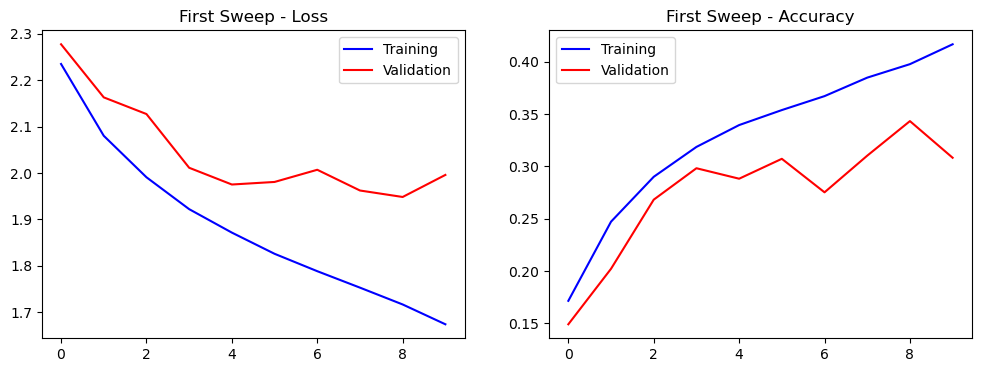

In [32]:
import matplotlib.pyplot as plt

def sweep_plot(sweep, title):
    loss = sweep.history['loss']
    val_loss = sweep.history['val_loss']
    accuracy = sweep.history['accuracy']
    val_accuracy = sweep.history['val_accuracy']

    epochs = range(len(loss))

    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, 'b', label='Training')
    plt.plot(epochs, val_loss, 'r', label='Validation')
    plt.legend()
    plt.title(f'{title} - Loss')
    
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, 'b', label='Training')
    plt.plot(epochs, val_accuracy, 'r', label='Validation')
    plt.legend()
    plt.title(f'{title} - Accuracy')
    
    plt.show()

# Plotting training/validation accuracy and loss for sweep 1
sweep_plot(sweep1, 'First Sweep')

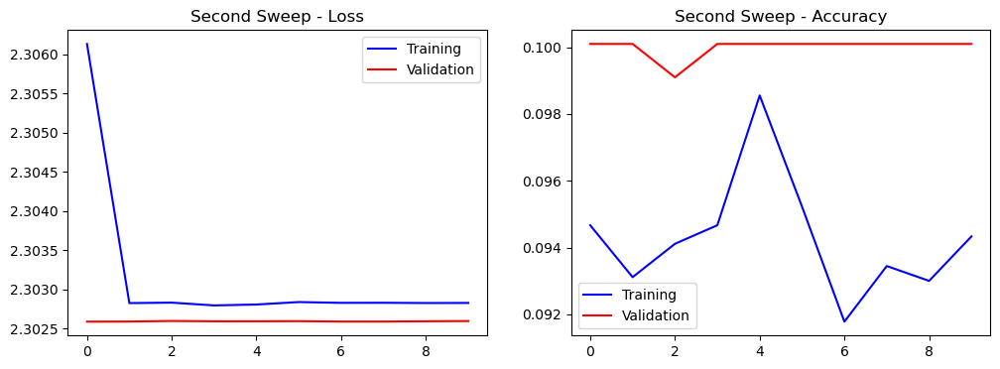

In [34]:
# Referencing the function to plot the sweep
sweep_plot(sweep2, 'Second Sweep')

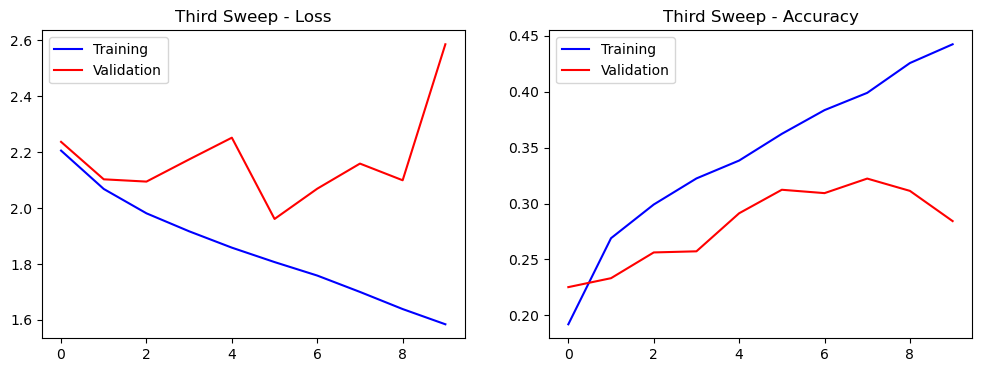

In [36]:
sweep_plot(sweep3, 'Third Sweep')

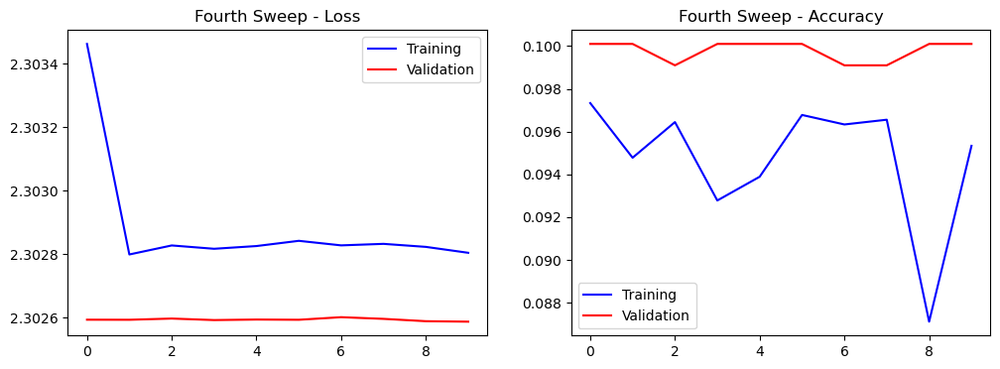

In [37]:
sweep_plot(sweep4, 'Fourth Sweep')

Question 5

You will now apply your best model on the test data (You shouldn't have used test data so far. All the above experiments should have been done using train and val data only).

(a) Use the best model from your sweep and report the accuracy on the test set.

In [39]:
model = keras.models.load_model('best_model')

train_loss, train_accuracy = model.evaluate(train)
val_loss, val_accuracy = model.evaluate(test)
print('train_loss = ', train_loss, 'train_accuracy = ', train_accuracy)
print('val_loss = ', val_loss, 'val_accuracy = ', val_accuracy)

test_datagen = ImageDataGenerator(rescale=1./255.)

test_loss, test_accuracy = model.evaluate(test)
print(f'Loss: ', test_loss)
print(f'Accuracy: ', test_accuracy)

32/32 [==============================] - 8s 245ms/step - loss: 2.5862 - accuracy: 0.2843
train_loss =  2.051621198654175 train_accuracy =  0.35633334517478943
val_loss =  2.5861704349517822 val_accuracy =  0.2842842936515808
32/32 [==============================] - 8s 255ms/step - loss: 2.5862 - accuracy: 0.2843
Loss:  2.5861706733703613
Accuracy:  0.2842842936515808


Gets about the same accuracy as the training model.

(b) Provide a 10 x 3 grid containing sample images from the test data and predictions made by your best model (more marks for presenting this grid creatively).

1/1 [==============================] - 0s 155ms/step


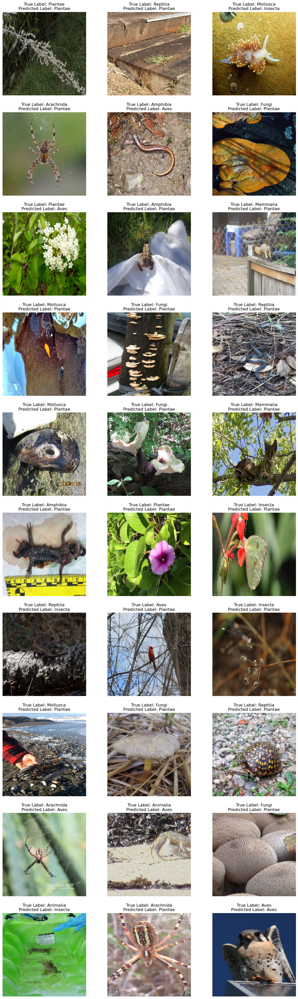

In [70]:
# Iterate through each layer in the model
for i in range(len(model.layers)):
    # Get the current layer
    layer = model.layers[i]
    
    # Check if the layer is convolutional
    if 'conv' not in layer.name:
        continue  # Skip non-convolutional layers
    
    # Get the filter weights and biases of the current layer
    filters, biases = layer.get_weights()

# Set up the plot figure
plt.figure(figsize=(15, 50))

# Iterate through 30 iterations
for i in range(30):
    # 10 by 3 grid
    ax = plt.subplot(10, 3, i + 1)
    # Get the next batch of images and labels
    image, label = test.next()
    plt.imshow(image[0])
    # Make predictions using the model
    y_hat = model.predict(image)
    
    # Display the true and predicted labels
    true_label = classes[np.where(label[0, :] == 1)[0][0]]
    predicted_label = classes[np.where(y_hat == np.amax(y_hat))[1][0]]
    
    plt.title(f"True Label: {true_label}\nPredicted Label: {predicted_label}")
    plt.axis("off")

# My model could use some improvements...

(c) Visualise all the filters in the first layer of your best model for a random image from the test set. If there are 64 filters in the first layer plot them in an 8 x 8 grid.

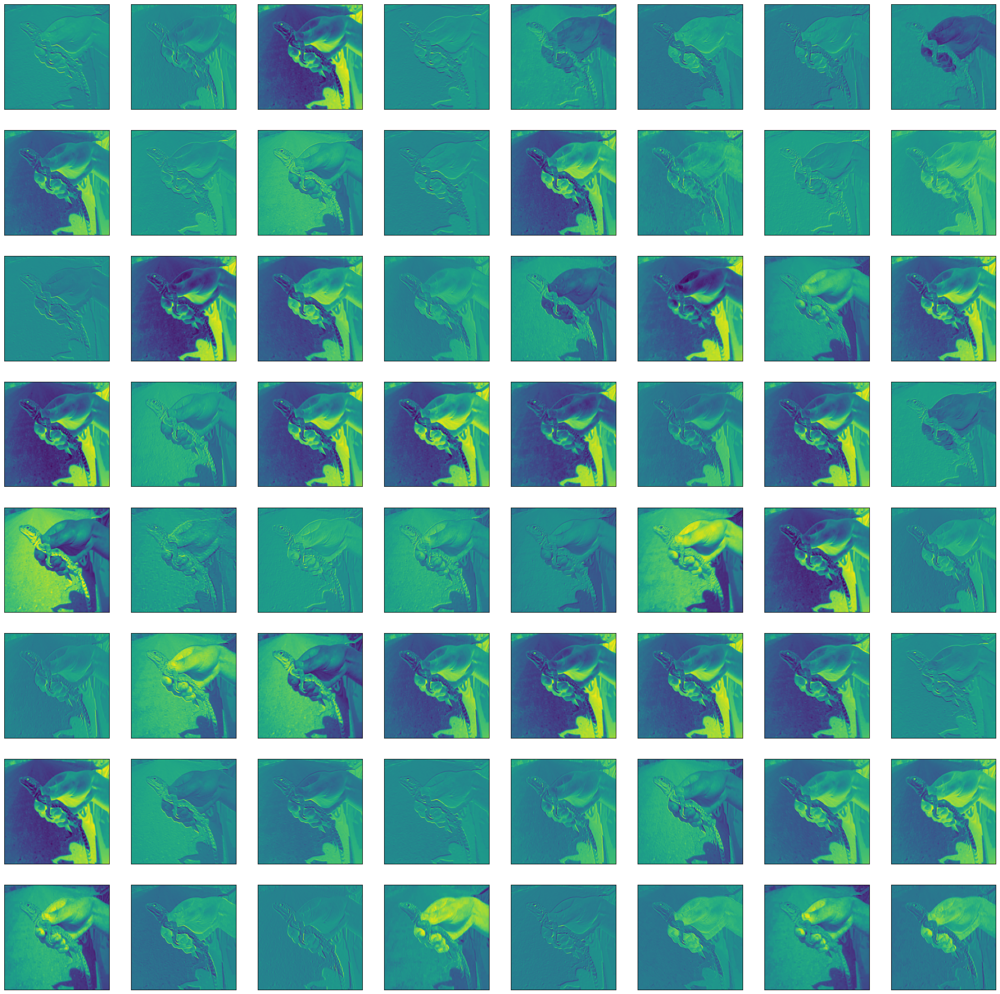

In [59]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing import image

# Hardcoded a random image from the validation folder
random_image_path = '/Users/hannahkaufman/BMI505/Assignment_2_Final/inaturalist_12K/val/Reptilia/5c43f599bad8929056d64b5793a955a6.jpg'
random_image = Image.open(random_image_path)
random_image = random_image.resize((224, 224))
random_image_array = keras.preprocessing.image.img_to_array(random_image)

# Get filters and biases from the first layer of the model
filters, biases = model.layers[0].get_weights()

def filter_pic(image_array, filter_array, biases):
    # Dimensions of filters
    h, w, d = filter_array.shape
    # Output dimensions
    h_output, w_output = image_array.shape[0] - h + 1, image_array.shape[1] - w + 1
    
    # Initialize output array
    output = np.zeros((h_output, w_output))
    
    # Perform the convolution
    for i in range(h_output):
        for j in range(w_output):
            h_start, w_start = i, j
            h_end, w_end = h_start + h, w_start + w
            output[i, j] = np.sum(image_array[h_start:h_end, w_start:w_end, :] * filter_array)

    return output + biases

# Set the size of the figure
plt.rcParams["figure.figsize"] = (30, 30)

# Visualize the output of each filter
for i in range(64):
    filter_i = filters[:, :, :, i]
    bias_i = biases[i]
    plt.subplot(8, 8, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(filter_pic(random_image_array, filter_i, bias_i))

The lizard is so cute!